In [1]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

%load_ext nb_black
use_cuda = True


<IPython.core.display.Javascript object>

In [2]:
import sys
data_path = "../../../TabulaSapiensData/"
ts_path = "../"
sys.path.append(ts_path)


<IPython.core.display.Javascript object>

In [3]:
import matplotlib.pyplot as plt

%matplotlib inline

<IPython.core.display.Javascript object>

In [4]:
adata = read_h5ad(data_path + "decontX/Pilot1_Pilot2.decontX.h5ad")

<IPython.core.display.Javascript object>

In [30]:
def FilterDE(de, cluster):
    is_MT = np.asarray(
        [
            (
                x.startswith("MT")
                or x.startswith("RP")
                or x.startswith("AC")
                or x.startswith("AL")
                or x.startswith("EEF")
            )
            for x in de[cluster].T.index
        ]
    )
    return de[cluster].T.loc[~is_MT][:20]

<IPython.core.display.Javascript object>

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


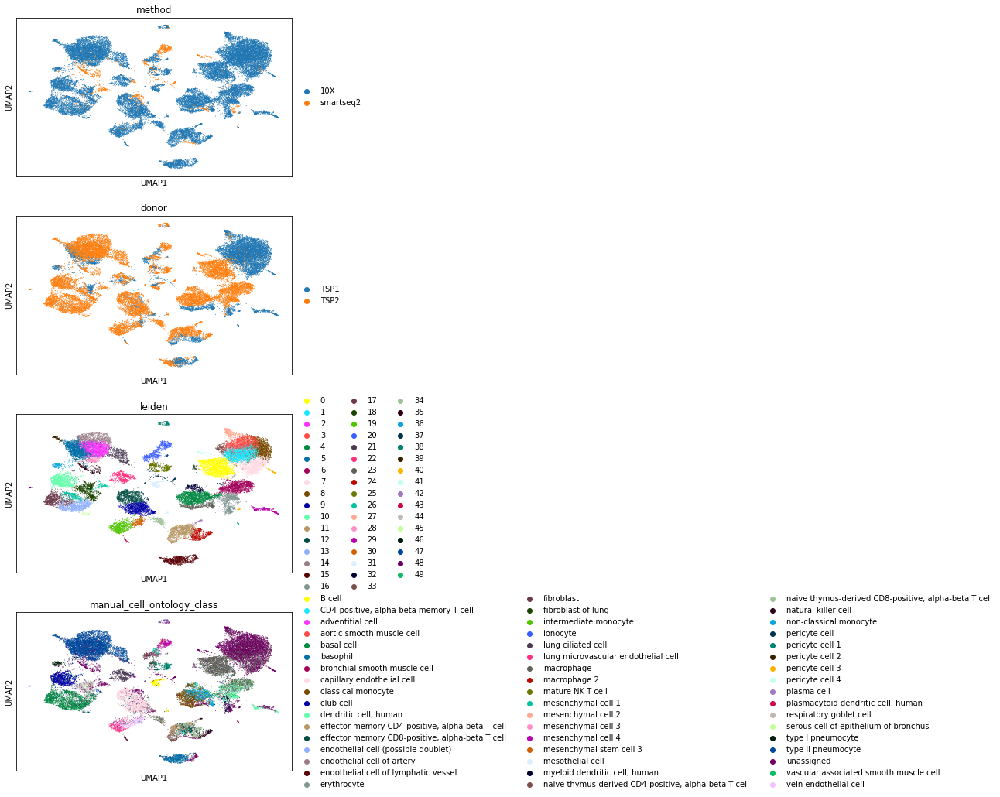

<IPython.core.display.Javascript object>

In [5]:
organ = "Lung"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [6]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

<IPython.core.display.Javascript object>

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

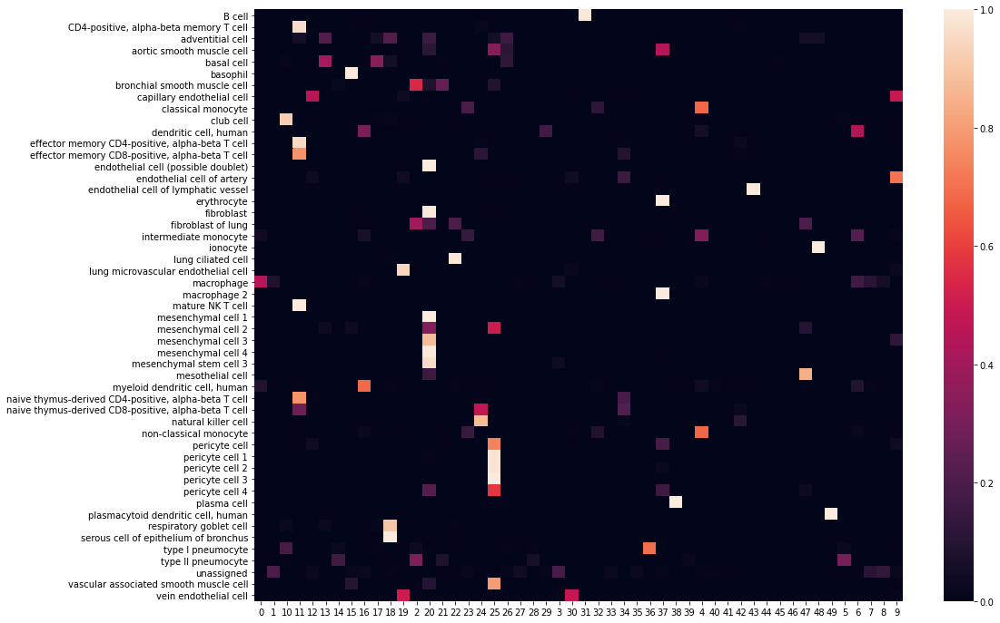

<IPython.core.display.Javascript object>

In [7]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.sum(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [8]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

<IPython.core.display.Javascript object>

In [9]:
cluster_composition["0"]

['basal cell: 0.00',
 'club cell: 0.00',
 'dendritic cell, human: 0.00',
 'intermediate monocyte: 0.00',
 'macrophage: 0.94',
 'myeloid dendritic cell, human: 0.01',
 'type II pneumocyte: 0.02',
 'unassigned: 0.03']

<IPython.core.display.Javascript object>

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [10]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

<IPython.core.display.Javascript object>

In [11]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

<ipython-input-10-963029a66ab7>:5: RuntimeWarning: invalid value encountered in long_scalars
  return (np.max(x) / np.sum(x), names[np.argmax(x)])


<IPython.core.display.Javascript object>

In [12]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

<IPython.core.display.Javascript object>

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


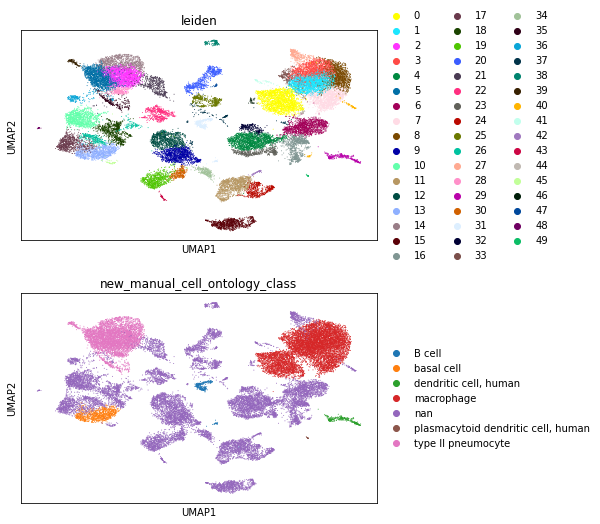

<IPython.core.display.Javascript object>

In [13]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

In [14]:
organ_adata.obs.groupby(["leiden"]).agg(
    {"new_manual_cell_ontology_class": set, "Propagated.Annotation": set}
)

,new_manual_cell_ontology_class,Propagated.Annotation
leiden,,
0,{macrophage},"{dendritic cell, human, intermediate monocyte,..."
1,{macrophage},"{myeloid dendritic cell, human, macrophage}"
2,{type II pneumocyte},"{bronchial smooth muscle cell, fibroblast of l..."
3,{macrophage},"{mesenchymal stem cell 3, macrophage}"
4,{nan},"{non-classical monocyte, dendritic cell, human..."
5,{type II pneumocyte},"{bronchial smooth muscle cell, club cell, type..."
6,{nan},"{dendritic cell, human, non-classical monocyte..."
7,{macrophage},"{dendritic cell, human, mesenchymal cell 4, my..."
8,{macrophage},{macrophage}


<IPython.core.display.Javascript object>

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


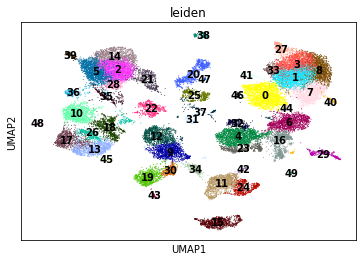

<IPython.core.display.Javascript object>

In [15]:
sc.pl.umap(organ_adata, color="leiden", legend_loc="on data")

# Sankey Diagram between cluster and compartment

In [16]:
from utils.colorDict import (
    donor_colors,
    method_colors,
    compartment_colors,
    tissue_colors,
)

<IPython.core.display.Javascript object>

In [17]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

<IPython.core.display.Javascript object>

# visualize compartment markers

In [19]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

<IPython.core.display.Javascript object>

In [20]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



<IPython.core.display.Javascript object>

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



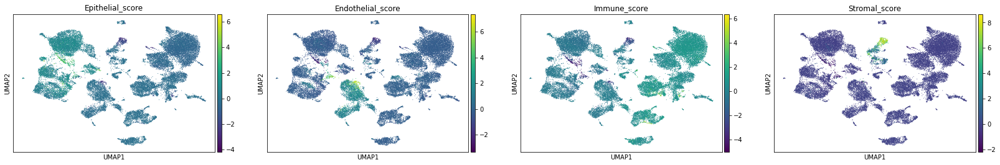

<IPython.core.display.Javascript object>

In [21]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [22]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

<IPython.core.display.Javascript object>

In [23]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


<IPython.core.display.Javascript object>

In [24]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

<IPython.core.display.Javascript object>

### top positive marker genes

In [25]:
organ_cluster_genes = pd.DataFrame(organ_adata.uns['rank_genes_groups']['names'])
organ_cluster_genes.iloc[:20]


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,HLA-DQA1,MCEMP1,PGC,INHBA,S100A8,SFTPC,CD163,MRC1,FBP1,FCN3,...,STMN1,CD163,MKI67,MMRN1,CD163,S100A2,CCL18,CFH,TMEM61,LILRA4
1,CCL18,INHBA,NAPSA,CD52,VCAN,SFTPA1,LGMN,SLC11A1,MCEMP1,EPAS1,...,TUBB,FTLP3,TOP2A,TFF3,CCL18,KRT5,FABP4,PLA2G2A,CD24,PLD4
2,CD163,CD52,SFTPC,FBP1,S100A9,SFTPA2,MARCKS,CYBB,EVL,RAMP2,...,CENPW,FTLP2,STMN1,PROX1,HLA-DQA1,KRT19,C1QB,TMEM98,ATP6V1G3,GZMB
3,C1QC,PPARG,PEBP4,HSPA1A,FGL2,SFTPD,CD84,CEBPB,CD52,TIMP3,...,H2AFZ,CD68,HMGB2,IGFBP7,GLDN,MIR205HG,LYZ,NNMT,ASCL3,JCHAIN
4,C1QB,CEBPB,SFTA2,IGSF6,FCN1,NAPSA,LHFPL2,CXCL3,HSPA1A,VWF,...,TYMS,VSIG4,ASPM,GNG11,LHFPL2,KRT15,C1QC,CALD1,HEPACAM2,MZB1
5,FCGR3A,PNPLA6,SFTPB,GPD1,MPEG1,SLC34A2,CTSB,GLIPR2,ALOX5AP,FAM107A,...,UBE2C,CTSD,HIST1H4C,CLDN5,TNFAIP2,ALDH3A1,HLA-DQA1,TIMP1,CLNK,IGKC
6,LGALS1,GPD1,SFTPA1,EVL,COTL1,LAMP3,RAP2B,VSIG4,BCL2A1,CLDN5,...,CKS1B,MS4A4A,CENPF,CCL21,DST,PERP,FTL,PRG4,TFF3,IRF7
7,MS4A4A,ALOX5,SFTPA2,BCL2A1,MS4A6A,SFTPB,MAFB,CD44,IGSF6,CALCRL,...,PCLAF,SLC11A1,TYMS,PPFIBP1,ADAM17,KRT17,APOC1,C1S,STAP1,PPP1R14B
8,GPNMB,MRC1,SFTPD,TGM2,MNDA,PEBP4,GPNMB,LAPTM5,LTA4H,MT1M,...,TUBA1B,FTL,CORO1A,CAVIN2,PSAP,PRSS23,APOE,LINC01133,SCNN1B,BCL11A
9,LYZ,CXCL16,LAMP3,CXCL16,RNASE2,SFTA2,NPL,FN1,TSPO,HYAL2,...,H2AFV,CTSB,TMPO,NR2F2,CTSB,ITGA2,MARCO,MSLN,SEC11C,C12orf75


<IPython.core.display.Javascript object>

In [26]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
HLA-DQA1,74.388527,6.143221,0.0
CCL18,72.324936,7.131940,0.0
CD163,71.350510,5.122709,0.0
C1QC,71.025200,5.382082,0.0
C1QB,70.369400,6.188259,0.0
FCGR3A,66.697929,4.079853,0.0
LGALS1,66.683716,4.107095,0.0
MS4A4A,65.813393,3.971148,0.0
GPNMB,65.683380,4.272098,0.0
LYZ,65.648651,4.660924,0.0


1


,wilcoxon_score,log fold change,adjusted pvalue
MCEMP1,65.754143,4.658421,0.0
INHBA,63.739777,5.004235,0.0
CD52,63.467373,4.533134,0.0
PPARG,62.660076,3.724480,0.0
CEBPB,62.287277,3.337894,0.0
PNPLA6,62.190144,3.331934,0.0
GPD1,62.111591,3.901826,0.0
ALOX5,61.400818,3.323994,0.0
MRC1,60.961327,4.023916,0.0
CXCL16,60.952019,3.422812,0.0


2


,wilcoxon_score,log fold change,adjusted pvalue
PGC,66.526245,7.842328,0.0
NAPSA,66.105286,7.099125,0.0
SFTPC,65.390816,10.528670,0.0
PEBP4,65.232841,5.117463,0.0
SFTA2,64.965065,5.527547,0.0
SFTPB,64.596024,7.026141,0.0
SFTPA1,64.565041,7.951131,0.0
SFTPA2,64.427086,7.934603,0.0
SFTPD,64.343643,5.541440,0.0
LAMP3,64.293640,4.945495,0.0


3


,wilcoxon_score,log fold change,adjusted pvalue
INHBA,59.089291,4.827226,0.0
CD52,57.402130,4.321840,0.0
FBP1,57.195103,4.267831,0.0
HSPA1A,56.983906,3.737551,0.0
IGSF6,56.835625,3.543602,0.0
GPD1,56.757626,3.714215,0.0
EVL,56.031342,3.099555,0.0
BCL2A1,56.012932,3.354884,0.0
TGM2,55.829777,3.457888,0.0
CXCL16,55.806717,3.320243,0.0


4


,wilcoxon_score,log fold change,adjusted pvalue
S100A8,60.856277,5.179690,0.0
VCAN,55.815845,4.595861,0.0
S100A9,54.789337,4.086006,0.0
FGL2,54.417820,3.451719,0.0
FCN1,54.208569,4.545147,0.0
MPEG1,45.634636,2.941083,0.0
COTL1,45.239609,2.396375,0.0
MS4A6A,43.802044,2.394663,0.0
MNDA,43.040939,2.481555,0.0
RNASE2,43.030384,5.048491,0.0


5


,wilcoxon_score,log fold change,adjusted pvalue
SFTPC,59.464573,9.933051,0.0
SFTPA1,59.430080,7.410968,0.0
SFTPA2,59.362625,7.433176,0.0
SFTPD,59.061302,4.959747,0.0
NAPSA,58.053440,6.146435,0.0
SLC34A2,57.924244,4.611704,0.0
LAMP3,57.572037,4.182316,0.0
SFTPB,57.063660,6.485705,0.0
PEBP4,56.547703,4.091099,0.0
SFTA2,56.534657,4.631692,0.0


6


,wilcoxon_score,log fold change,adjusted pvalue
CD163,52.491203,4.125831,0.0
LGMN,50.567146,3.708640,0.0
MARCKS,50.434036,3.404769,0.0
CD84,46.900169,3.245486,0.0
LHFPL2,46.596996,3.151656,0.0
CTSB,46.397652,3.040633,0.0
RAP2B,45.922768,2.757233,0.0
MAFB,45.728405,2.805306,0.0
GPNMB,45.550777,3.505211,0.0
NPL,44.584339,2.970487,0.0


7


,wilcoxon_score,log fold change,adjusted pvalue
MRC1,52.979965,4.290119,0.0
SLC11A1,50.685608,3.628061,0.0
CYBB,50.232613,3.408203,0.0
CEBPB,49.631546,3.203669,0.0
CXCL3,48.801319,3.912664,0.0
GLIPR2,48.550217,3.020516,0.0
VSIG4,48.509941,3.873926,0.0
CD44,48.320690,2.527654,0.0
LAPTM5,48.020264,3.252310,0.0
FN1,47.778404,4.642389,0.0


8


,wilcoxon_score,log fold change,adjusted pvalue
FBP1,53.328182,4.665030,0.0
MCEMP1,52.142544,4.384813,0.0
EVL,51.958508,3.327484,0.0
CD52,51.695427,4.458462,0.0
HSPA1A,50.765877,3.819297,0.0
ALOX5AP,50.434368,4.355113,0.0
BCL2A1,50.302746,3.452956,0.0
IGSF6,49.793598,3.546923,0.0
LTA4H,49.554920,3.237038,0.0
TSPO,49.184727,3.151214,0.0


9


,wilcoxon_score,log fold change,adjusted pvalue
FCN3,52.255539,5.801583,0.0
EPAS1,50.104897,3.339536,0.0
RAMP2,50.061756,3.916001,0.0
TIMP3,49.452129,4.383299,0.0
VWF,49.259167,4.239466,0.0
FAM107A,48.070026,3.906112,0.0
CLDN5,47.932899,4.095714,0.0
CALCRL,47.848629,3.969340,0.0
MT1M,46.708656,4.292120,0.0
HYAL2,46.586086,3.185329,0.0


10


,wilcoxon_score,log fold change,adjusted pvalue
SCGB3A2,51.135197,7.632983,0.000000e+00
CYP2B7P,50.301300,4.064712,0.000000e+00
GPRC5A,45.929874,3.285962,0.000000e+00
WFDC2,44.978092,3.856275,0.000000e+00
NEDD4L,41.847332,2.847366,0.000000e+00
SCGB3A1,41.618076,3.657133,0.000000e+00
SLPI,41.520397,4.745972,0.000000e+00
CEACAM6,41.395149,4.074741,0.000000e+00
FOLR1,41.236351,2.936798,0.000000e+00
ELF3,40.669964,2.892854,0.000000e+00


11


,wilcoxon_score,log fold change,adjusted pvalue
IL32,49.072983,4.523850,0.000000e+00
CD3D,48.760868,5.584612,0.000000e+00
CD3E,46.086067,5.722698,0.000000e+00
CD2,44.188042,4.831812,0.000000e+00
TRAC,44.082314,5.525945,0.000000e+00
CD3G,41.676872,5.508853,0.000000e+00
CD69,41.245491,3.661260,0.000000e+00
CXCR4,40.544605,2.928850,0.000000e+00
TRBC2,37.616272,5.498287,1.224938e-306
IL7R,35.202747,3.446797,1.335730e-268


12


,wilcoxon_score,log fold change,adjusted pvalue
CLDN5,49.446697,6.325989,0.0
AQP1,48.564320,5.361595,0.0
GNG11,47.729343,5.054448,0.0
TIMP3,47.035934,5.525340,0.0
CAVIN2,46.761147,4.884053,0.0
HYAL2,46.583599,4.866644,0.0
CA4,46.290955,6.117222,0.0
EPAS1,46.237259,4.544721,0.0
RAMP2,46.029457,5.206071,0.0
EDNRB,45.994465,5.668438,0.0


13


,wilcoxon_score,log fold change,adjusted pvalue
S100A2,50.374554,6.891974,0.0
MIR205HG,49.874271,6.191173,0.0
KRT5,49.733891,7.239902,0.0
KRT19,49.012547,6.523544,0.0
PERP,47.321564,4.589931,0.0
PRSS23,46.371506,5.114147,0.0
TACSTD2,45.132988,4.260903,0.0
ADH7,43.601177,6.176594,0.0
CHST9,42.678814,5.038686,0.0
AQP3,42.435463,3.518126,0.0


14


,wilcoxon_score,log fold change,adjusted pvalue
HOPX,45.282951,5.111552,0.0
SFTA2,43.968597,4.985402,0.0
FASN,43.699684,4.142376,0.0
S100A14,43.687511,3.900915,0.0
MACROD2,43.281143,3.769406,0.0
TTN,43.242439,4.420597,0.0
LPCAT1,43.237122,4.089864,0.0
SFTPB,43.234943,6.485332,0.0
LAMP3,43.125378,4.246875,0.0
LRRK2,43.031395,4.232866,0.0


15


,wilcoxon_score,log fold change,adjusted pvalue
TPSB2,49.770725,13.855384,0.000000e+00
TPSAB1,49.712418,14.489253,0.000000e+00
CPA3,49.538193,14.006243,0.000000e+00
MS4A2,47.358631,11.584663,0.000000e+00
RHEX,46.520992,10.730778,0.000000e+00
HPGDS,46.393826,5.025259,0.000000e+00
KIT,45.655880,7.663453,0.000000e+00
CD69,44.565388,4.916855,0.000000e+00
GATA2,42.547291,4.868311,0.000000e+00
VWA5A,42.483418,4.162434,0.000000e+00


16


,wilcoxon_score,log fold change,adjusted pvalue
MS4A6A,37.760082,3.770102,0.000000e+00
GPR183,37.413456,4.628122,6.949953e-302
FGL2,35.601795,3.536370,2.578645e-273
CSF1R,32.249718,3.435035,5.224977e-224
RGS1,32.103931,3.686050,4.574693e-222
RNASE6,31.942097,3.115975,6.824926e-220
MEF2C,27.753246,2.549458,7.811116e-166
HCLS1,27.287699,2.121499,2.496385e-160
RGS2,26.952974,2.779484,1.936972e-156
F13A1,26.561712,4.551948,6.513480e-152


17


,wilcoxon_score,log fold change,adjusted pvalue
MIR205HG,44.146641,5.300831,0.000000e+00
S100A2,42.038071,4.971085,0.000000e+00
IGFBP2,39.467133,3.778082,0.000000e+00
PERP,39.107521,3.365791,0.000000e+00
KRT19,38.303257,3.856828,0.000000e+00
TACSTD2,37.460125,3.266340,4.032188e-303
KRT17,34.756527,5.300124,5.910942e-261
KRT15,34.122837,4.726002,1.531668e-251
KRT5,32.788639,4.527711,3.355130e-232
EGFR,32.149940,2.634471,3.064396e-223


18


,wilcoxon_score,log fold change,adjusted pvalue
WFDC2,46.516972,7.410071,0.000000e+00
BPIFB1,45.253021,10.423452,0.000000e+00
LCN2,44.847778,8.189130,0.000000e+00
SCGB3A1,44.234322,8.153605,0.000000e+00
SCGB1A1,43.833832,8.960761,0.000000e+00
KRT19,42.946289,6.088768,0.000000e+00
SLPI,42.840069,7.103456,0.000000e+00
CP,41.316349,6.258921,0.000000e+00
KRT7,41.149914,4.997895,0.000000e+00
AGR2,41.140728,5.409027,0.000000e+00


19


,wilcoxon_score,log fold change,adjusted pvalue
ACKR1,45.619530,8.683484,0.0
VWF,44.872139,5.799257,0.0
SPARCL1,43.860401,6.254906,0.0
NPDC1,43.760582,4.817079,0.0
PLVAP,43.163193,7.935739,0.0
IGFBP7,42.976059,5.027608,0.0
LIFR,41.804699,4.531719,0.0
HSPG2,40.490204,4.723384,0.0
CLDN5,40.275818,4.608087,0.0
ADGRL4,40.187035,5.000976,0.0


20


,wilcoxon_score,log fold change,adjusted pvalue
DCN,44.095562,15.001947,0.000000e+00
C1S,43.485283,11.246481,0.000000e+00
MGP,43.167896,10.593834,0.000000e+00
FBLN1,42.086411,12.820760,0.000000e+00
C1R,41.882862,10.244234,0.000000e+00
COL6A2,41.834492,9.497967,0.000000e+00
ADH1B,41.250351,12.797366,0.000000e+00
COL1A2,40.853569,11.996778,0.000000e+00
PRELP,40.304356,10.963388,0.000000e+00
MFAP4,40.293552,13.087523,0.000000e+00


21


,wilcoxon_score,log fold change,adjusted pvalue
PGC,29.138470,4.537045,9.835695e-183
SFTPA1,28.548485,5.308012,1.233460e-175
SFTPA2,28.512915,5.459387,3.060806e-175
SFTPC,28.320185,7.386615,6.042591e-173
NAPSA,27.569958,4.090726,6.007620e-164
SFTPB,26.555447,4.763394,4.087572e-152
SFTA2,26.073853,3.049209,1.062421e-146
HOPX,25.503534,3.019892,2.304985e-140
SLC34A2,24.989033,2.761254,8.610990e-135
LAMP3,24.415239,2.690298,1.100986e-128


22


,wilcoxon_score,log fold change,adjusted pvalue
C20orf85,38.856449,13.312782,0.000000e+00
C9orf24,38.642029,12.646467,0.000000e+00
TMEM190,38.574127,14.592969,0.000000e+00
CAPS,38.548588,8.508307,0.000000e+00
PIFO,38.543980,8.715692,0.000000e+00
C1orf194,38.422489,13.629986,0.000000e+00
RSPH1,38.391758,11.059621,0.000000e+00
FAM183A,38.323463,11.586861,0.000000e+00
C11orf88,38.164318,11.018447,0.000000e+00
TPPP3,38.161278,7.896900,0.000000e+00


23


,wilcoxon_score,log fold change,adjusted pvalue
FCN1,36.334194,6.207185,2.748770e-284
CD48,32.871788,4.438490,1.637443e-232
TNFRSF1B,32.683598,4.134099,5.242086e-230
NAMPT,30.531919,3.176790,1.446476e-200
COTL1,30.146704,3.437477,1.394987e-195
VSIR,29.343328,3.240904,2.139125e-185
CD300E,29.085461,5.560666,3.586411e-182
CORO1A,28.894377,3.717412,8.270175e-180
S100A8,28.737118,4.971152,7.022948e-178
FGL2,27.887344,3.508227,1.863855e-167


24


,wilcoxon_score,log fold change,adjusted pvalue
NKG7,37.407463,6.495048,1.739736e-301
GZMA,35.670948,6.221323,3.284182e-274
CCL5,34.523567,6.195942,6.974623e-257
KLRD1,34.470592,6.657184,3.257630e-256
PRF1,34.164871,6.742985,9.469508e-252
GNLY,33.877483,7.615441,1.202368e-247
CST7,33.698174,5.397474,4.524339e-245
GZMB,32.004753,6.891854,4.594038e-221
CCL4,30.442209,4.880594,4.967703e-200
IL32,28.917681,4.161452,1.452832e-180


25


,wilcoxon_score,log fold change,adjusted pvalue
CALD1,34.189396,5.813251,2.046152e-251
PPP1R14A,34.049843,7.745263,1.201121e-249
TPM2,33.625587,7.115585,1.391756e-243
MYL9,32.880043,5.395675,6.239602e-233
IGFBP7,32.391354,5.246833,4.277540e-226
BGN,32.213432,6.754735,1.123001e-223
PDGFRB,31.822977,6.543387,2.619054e-218
NR2F2,30.839882,4.540896,5.633924e-205
TAGLN,30.468502,5.840796,4.457136e-200
SPARCL1,30.076847,4.921482,5.729124e-195


26


,wilcoxon_score,log fold change,adjusted pvalue
MIR205HG,30.661572,6.935771,1.090714e-201
KRT19,29.484367,6.231331,1.344450e-186
PERP,28.705803,4.927795,6.336858e-177
EPAS1,28.328150,5.051108,2.289894e-172
CAV1,28.273195,5.464272,8.693198e-172
TACSTD2,28.135345,5.130367,3.553244e-170
S100A2,27.995934,5.925292,1.531446e-168
MT1X,27.896160,4.993238,2.185627e-167
CAVIN2,27.304600,4.842781,2.446595e-160
TIMP3,27.282560,4.979071,4.021573e-160


27


,wilcoxon_score,log fold change,adjusted pvalue
ZFAS1,27.261299,2.360195,7.187046e-159
LGALS3,25.673178,3.275593,6.859594e-141
EIF1,24.708817,1.778532,1.687331e-130
SLC11A1,23.432329,2.960355,2.946153e-117
SLC3A2,23.251919,2.134884,1.601707e-115
FTH1,23.030087,3.216383,1.999085e-113
TDRD3,23.029207,2.755667,1.999085e-113
MT-ND5,22.668692,2.099862,6.716119e-110
MT-ND2,22.597971,2.298849,2.967991e-109
CYP27A1,22.549093,2.799817,8.068984e-109


28


,wilcoxon_score,log fold change,adjusted pvalue
SFTPA1,28.194321,7.743925,4.041201e-170
SFTPC,27.966572,10.080472,1.220182e-167
SFTPD,27.811974,5.341049,6.098795e-166
CTSH,27.678261,3.949246,1.877521e-164
SFTPA2,27.475128,7.545567,4.098803e-162
C16orf89,27.278873,4.012008,7.412886e-160
C4BPA,27.145437,4.204264,2.410579e-158
NAPSA,27.006720,6.335522,9.068331e-157
ABCA3,26.446426,4.243418,2.623616e-150
SELENBP1,26.124205,3.623041,1.139741e-146


29


,wilcoxon_score,log fold change,adjusted pvalue
FCGR2B,26.156559,5.251559,4.885973e-146
TMEM176B,25.852020,4.779426,6.796758e-143
TMEM176A,24.934504,4.451439,6.171333e-133
GPR183,24.055519,3.984828,8.604991e-124
CCL3,23.271770,4.535225,8.403687e-116
A2M,22.233131,3.143414,1.074466e-105
PLA2G7,21.758652,4.985346,3.367718e-101
CD84,21.745584,3.231070,4.070543e-101
FOLR2,21.646019,4.730896,3.250778e-100
MARCKS,20.919210,2.668374,1.317199e-93


30


,wilcoxon_score,log fold change,adjusted pvalue
ACKR1,28.711372,7.458699,1.619811e-176
VWF,28.283297,5.763165,1.632690e-171
RAMP3,27.296589,4.908208,9.137089e-160
C7,27.096128,6.141970,1.609656e-157
PTPRB,27.028593,4.911451,8.028622e-157
TIMP3,26.925001,5.277794,1.098506e-155
PRSS23,26.412001,4.778600,8.389784e-150
SRPX,26.236418,4.820840,7.516047e-148
IGFBP7,26.098989,4.529716,2.448639e-146
CALCRL,25.830757,4.193831,2.356787e-143


31


,wilcoxon_score,log fold change,adjusted pvalue
CD79A,27.586637,8.385946,9.475894e-163
MS4A1,26.895079,9.876775,3.690376e-155
LTB,23.371056,4.679863,3.540526e-117
CXCR4,23.018267,3.019047,1.059413e-113
IGKC,21.459904,7.313805,6.583860e-99
BANK1,21.427940,4.662632,1.270082e-98
TNFRSF13C,21.387375,8.504483,2.945877e-98
CD79B,20.653193,5.503163,1.120708e-91
CD48,16.778267,2.506246,1.109228e-60
FCMR,15.329063,3.603425,9.531975e-51


32


,wilcoxon_score,log fold change,adjusted pvalue
S100A8,24.424343,4.736966,5.551610e-127
VCAN,23.136562,4.113160,5.843315e-114
S100A9,21.996218,3.781284,6.142388e-103
FCN1,20.673723,3.636081,8.790084e-91
FGL2,20.271563,2.990934,2.699283e-87
S100A12,18.010542,4.230666,9.480565e-69
VSIR,17.834932,2.233223,2.025732e-67
COTL1,17.354837,2.184545,8.210567e-64
FKBP5,17.174738,1.682773,1.611100e-62
CORO1A,17.021982,2.533385,2.076199e-61


33


,wilcoxon_score,log fold change,adjusted pvalue
INHBA,17.744274,3.098236,1.123527e-65
MCEMP1,16.163412,2.448860,1.792836e-54
MSR1,16.134926,2.498797,2.133764e-54
TGM2,15.602724,2.041162,6.843988e-51
MRC1,14.875798,2.393148,2.533058e-46
CD52,14.141096,2.306617,8.912761e-42
CXCL16,14.017690,1.901550,4.768701e-41
HBEGF,13.403797,1.686082,1.610433e-37
FBP1,13.263228,1.816475,1.012173e-36
SLC11A1,13.190426,1.916477,2.549865e-36


34


,wilcoxon_score,log fold change,adjusted pvalue
CCL5,21.250654,4.997016,3.189845e-96
IL32,20.977646,3.452739,7.723851e-94
TIMP3,19.750246,3.024215,2.610791e-83
FCN3,19.094412,3.599659,6.892888e-78
RAMP2,18.295174,2.438037,1.267301e-71
EPAS1,18.283371,1.993060,1.537026e-71
MT1M,18.255802,2.782188,2.434086e-71
GIMAP7,18.235746,2.518938,3.437029e-71
GZMA,18.145401,4.557527,1.712280e-70
ETS1,17.364670,2.959437,1.450650e-64


35


,wilcoxon_score,log fold change,adjusted pvalue
SFTPD,26.396761,12.387920,4.808201e-149
NAPSA,26.372875,12.851103,4.808201e-149
SLC34A2,26.370918,11.760027,4.808201e-149
CTSH,26.361561,11.000781,4.808201e-149
SFTPC,26.354782,16.751802,4.808201e-149
SFTPB,26.351751,15.001835,4.808201e-149
SFTA2,26.320717,10.355203,9.343694e-149
SFTPA2,26.279543,16.429325,2.001592e-148
PIGR,26.278500,10.774089,2.001592e-148
SFTPA1,26.276464,15.583693,2.001592e-148


36


,wilcoxon_score,log fold change,adjusted pvalue
EMP2,23.458881,5.181800,6.316175e-117
GPRC5A,23.290453,5.004239,1.630589e-115
AGER,22.990705,7.960903,1.133133e-112
KRT7,22.776226,5.188207,1.161219e-110
LMO7,22.740362,4.228251,2.104561e-110
TSPAN13,22.140295,4.148804,1.269481e-104
AQP4,22.106096,4.735153,2.322436e-104
CAV2,21.781229,4.132895,2.572370e-101
CAV1,21.660295,5.008080,3.179714e-100
CEACAM6,21.583706,5.928573,1.504391e-99


37


,wilcoxon_score,log fold change,adjusted pvalue
FTH1P20,8.181850,2.850386,9.702399e-15
AL512646.1,8.011099,3.905659,3.732737e-14
TMSB4XP8,6.377061,3.770045,3.868621e-09
TMSB4XP4,6.296602,2.411124,6.398973e-09
MTRNR2L12,5.978892,2.204623,4.366604e-08
TMSB4XP1,4.679580,3.205285,4.071941e-05
IL1R2,4.661241,5.226894,4.433011e-05
FTLP3,4.567486,1.723756,6.781513e-05
IFITM2,3.964280,2.510116,8.725341e-04
TMSB4XP2,3.800060,3.060986,1.641516e-03


38


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,19.855307,12.625712,5.837195e-83
DERL3,19.079496,9.801278,1.100422e-76
FKBP11,18.881842,5.975808,3.156918e-75
SSR4,17.999685,4.057315,2.883552e-68
JCHAIN,17.806997,15.102674,7.343016e-67
ISG20,17.384172,4.457115,9.145624e-64
IGKC,17.165571,14.828975,3.537619e-62
CD79A,16.481565,7.916928,2.930484e-57
TNFRSF17,16.351206,11.917441,2.282347e-56
PRDX4,15.917645,3.466278,2.164764e-53


39


,wilcoxon_score,log fold change,adjusted pvalue
TTN,13.825850,4.154407,1.309854e-40
LRRK2,12.487290,3.268826,3.791332e-33
CCDC141,12.290106,3.556589,4.099731e-32
MALAT1,12.277503,1.886075,4.758705e-32
PGC,11.835220,3.637876,8.784943e-30
DUOX1,11.782842,2.530348,1.609745e-29
SFTPC,11.482290,6.214645,4.913920e-28
SFTPA1,11.455481,3.808668,6.596322e-28
ABCA3,11.423222,3.003026,9.417324e-28
SFTPA2,11.380389,3.865063,1.503789e-27


40


,wilcoxon_score,log fold change,adjusted pvalue
STMN1,15.599175,6.066555,4.341067e-50
TUBB,15.364971,5.092747,8.276026e-49
CENPW,15.112718,5.169394,2.620064e-47
H2AFZ,15.073248,4.248715,3.497018e-47
TYMS,15.059950,8.324689,3.497018e-47
UBE2C,14.946184,9.300549,1.618278e-46
CKS1B,14.908688,4.276110,2.276075e-46
PCLAF,14.901083,8.241569,2.276075e-46
TUBA1B,14.896373,4.774131,2.276075e-46
H2AFV,14.694569,3.499476,4.111603e-45


41


,wilcoxon_score,log fold change,adjusted pvalue
CD163,13.174966,10.612005,5.913834e-36
FTLP3,13.168388,12.095081,5.913834e-36
FTLP2,13.166759,11.902723,5.913834e-36
CD68,13.165709,10.536567,5.913834e-36
VSIG4,13.164177,10.140756,5.913834e-36
CTSD,13.163196,10.365177,5.913834e-36
MS4A4A,13.162771,9.838528,5.913834e-36
SLC11A1,13.153938,9.566499,5.913834e-36
FTL,13.153083,10.830216,5.913834e-36
CTSB,13.143206,10.852956,5.913834e-36


42


,wilcoxon_score,log fold change,adjusted pvalue
MKI67,12.535943,8.706223,2.794444e-31
TOP2A,12.266051,7.638552,4.056476e-30
STMN1,12.121266,4.769506,1.599114e-29
HMGB2,12.068125,4.387499,2.290642e-29
ASPM,11.861856,8.742139,2.199221e-28
HIST1H4C,11.561860,3.870132,6.308997e-27
CENPF,11.528932,7.119974,7.931208e-27
TYMS,11.237893,6.284047,1.954830e-25
CORO1A,10.971442,4.074696,3.429479e-24
TMPO,10.697921,3.519143,5.570595e-23


43


,wilcoxon_score,log fold change,adjusted pvalue
MMRN1,11.600821,7.923602,2.402763e-26
TFF3,11.454670,6.092474,6.558390e-26
PROX1,10.946416,8.631253,1.356540e-23
IGFBP7,10.565072,5.356840,6.367305e-22
GNG11,10.433121,4.516356,2.060961e-21
CLDN5,10.357272,4.847588,3.805597e-21
CCL21,10.226506,12.202104,1.198986e-20
PPFIBP1,10.219048,4.281138,1.198986e-20
CAVIN2,9.986394,3.824607,1.143560e-19
NR2F2,9.566839,3.789915,6.488885e-18


44


,wilcoxon_score,log fold change,adjusted pvalue
CD163,9.622380,4.415264,3.786833e-17
CCL18,9.005938,4.857445,2.790407e-15
HLA-DQA1,8.878511,3.079571,6.648489e-15
GLDN,7.863060,2.909727,4.163793e-12
LHFPL2,7.641996,2.864499,1.998588e-11
TNFAIP2,7.548219,2.457515,3.820054e-11
DST,7.500513,2.192063,5.423589e-11
ADAM17,7.355089,2.113186,1.440052e-10
PSAP,7.334179,2.548989,1.641617e-10
CTSB,7.272433,2.583653,2.534779e-10


45


,wilcoxon_score,log fold change,adjusted pvalue
S100A2,8.643505,4.078546,1.106638e-14
KRT5,8.192244,4.296281,2.600959e-13
KRT19,7.630499,2.990966,1.110208e-11
MIR205HG,7.620759,3.713448,1.178274e-11
KRT15,6.921253,3.994814,9.279628e-10
ALDH3A1,6.254438,3.182451,4.636493e-08
PERP,6.066002,1.853862,1.293104e-07
KRT17,5.397912,3.213540,4.300183e-06
PRSS23,5.006614,1.674013,2.796872e-05
ITGA2,4.928873,2.350981,3.965205e-05


46


,wilcoxon_score,log fold change,adjusted pvalue
CCL18,5.628994,3.732557,0.000008
FABP4,5.606230,3.224801,0.000009
C1QB,5.085819,3.225359,0.000091
LYZ,4.898477,2.704366,0.000197
C1QC,4.873962,2.279778,0.000217
HLA-DQA1,4.825390,2.799612,0.000267
FTL,4.641645,2.970662,0.000553
APOC1,4.622602,3.097043,0.000592
APOE,4.474297,2.805432,0.001052
MARCO,4.447394,2.064425,0.001158


47


,wilcoxon_score,log fold change,adjusted pvalue
CFH,7.916855,5.619088,1.434032e-10
PLA2G2A,7.786181,8.371359,1.490623e-10
TMEM98,7.732140,4.266081,1.490623e-10
NNMT,7.728571,5.452845,1.490623e-10
CALD1,7.709206,5.099879,1.490623e-10
TIMP1,7.539503,5.618072,3.828122e-10
PRG4,7.531394,10.111279,3.828122e-10
C1S,7.526744,4.937242,3.828122e-10
LINC01133,7.441837,6.346645,6.494982e-10
MSLN,7.276265,5.982142,1.878271e-09


48


,wilcoxon_score,log fold change,adjusted pvalue
TMEM61,7.528809,8.232277,3.014447e-09
CD24,7.301392,6.218285,8.000125e-09
ATP6V1G3,7.150166,15.350527,8.000125e-09
ASCL3,7.149279,14.440728,8.000125e-09
HEPACAM2,7.145596,11.080441,8.000125e-09
CLNK,7.139094,9.810744,8.000125e-09
TFF3,7.137381,5.354960,8.000125e-09
STAP1,7.114276,8.446433,8.278697e-09
SCNN1B,6.958383,5.806007,2.066635e-08
SEC11C,6.945221,3.654563,2.066635e-08


49


,wilcoxon_score,log fold change,adjusted pvalue
LILRA4,7.546249,11.376953,7.985287e-10
PLD4,7.531896,9.309561,7.985287e-10
GZMB,7.506009,8.500250,7.985287e-10
JCHAIN,7.495241,8.904187,7.985287e-10
MZB1,7.492021,8.466103,7.985287e-10
IGKC,7.439639,7.810591,9.205308e-10
IRF7,7.425346,5.754778,9.205308e-10
PPP1R14B,7.411273,4.436871,9.205308e-10
BCL11A,7.335690,5.742472,1.442857e-09
C12orf75,7.303471,6.093915,1.650940e-09


<IPython.core.display.Javascript object>

0


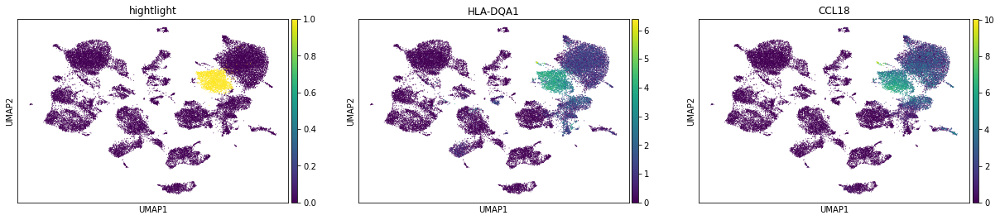

1


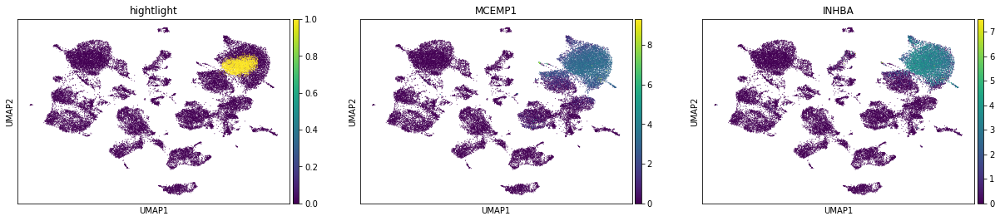

2


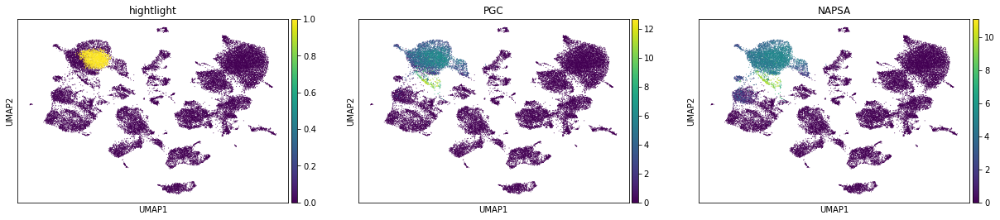

3


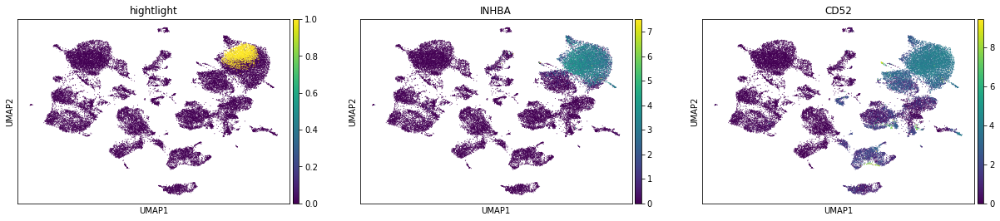

4


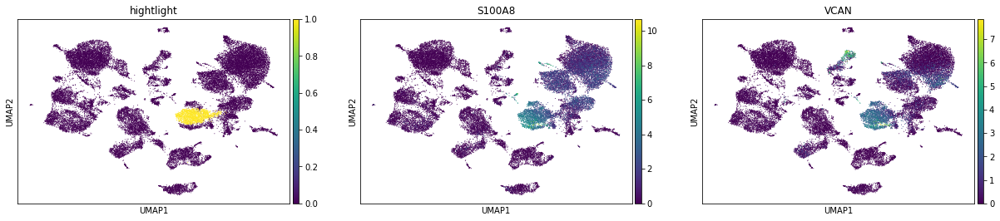

5


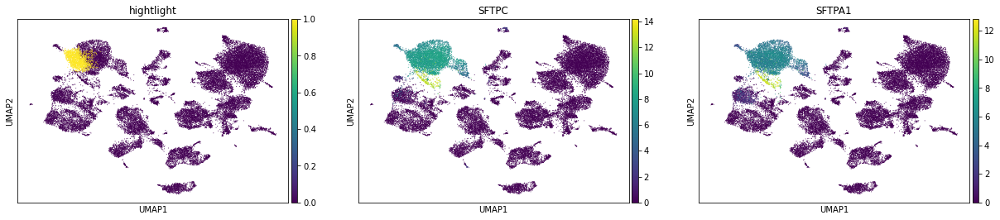

6


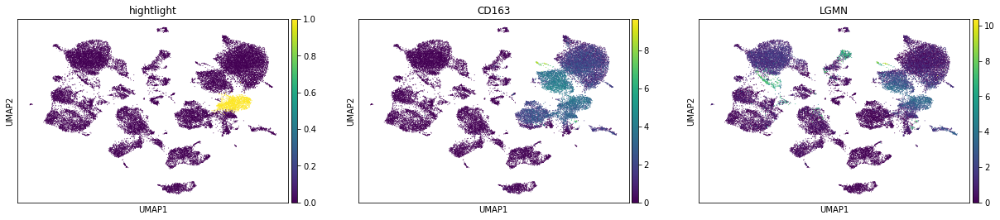

7


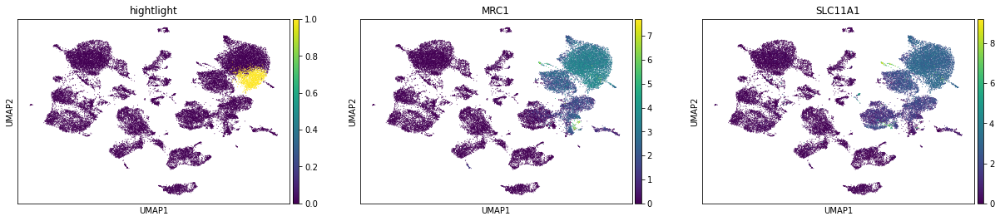

8


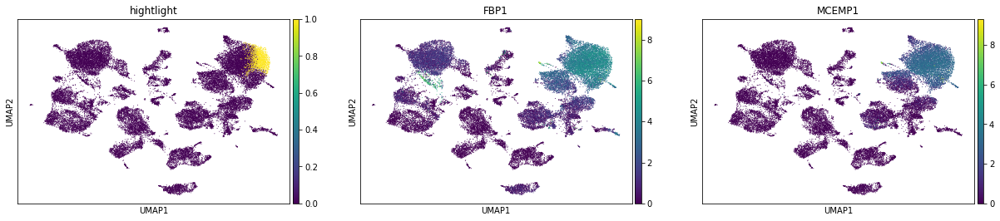

9


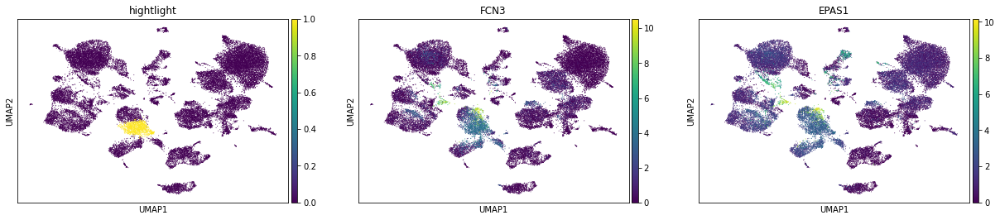

10


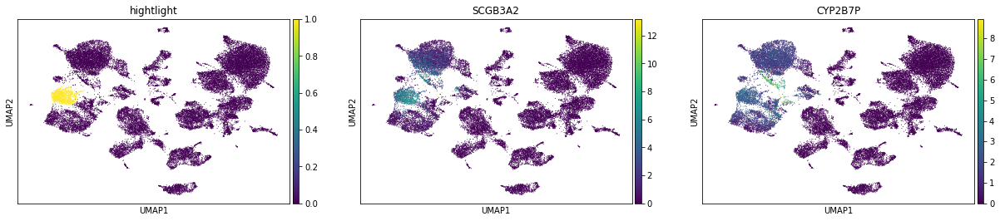

11


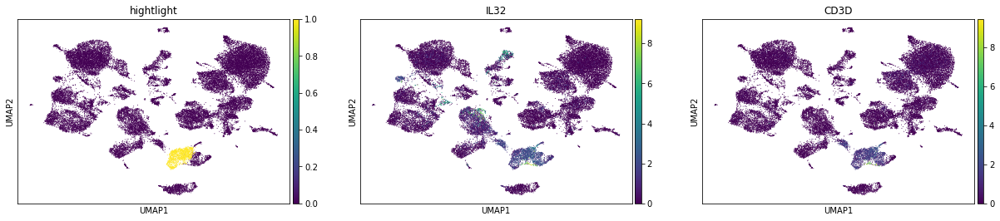

12


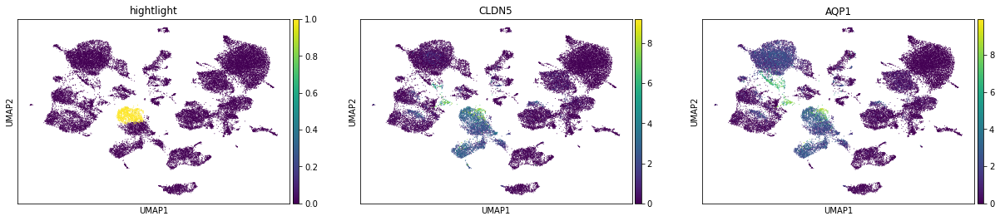

13


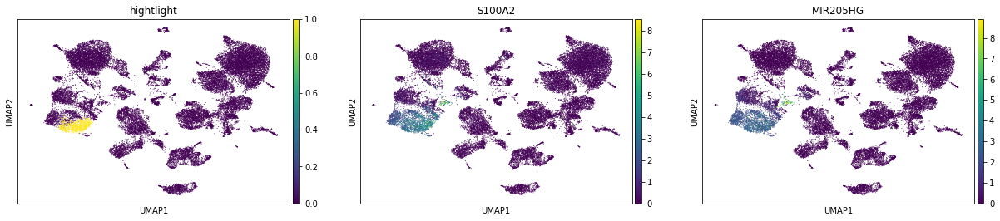

14


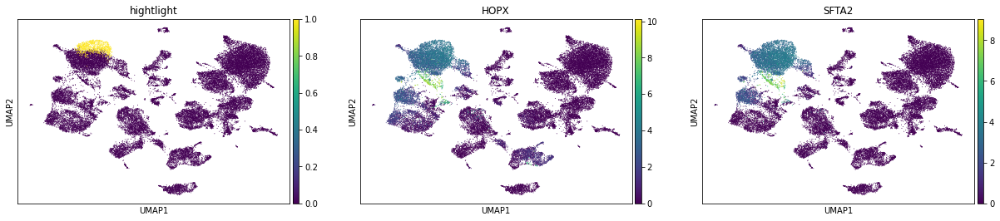

15


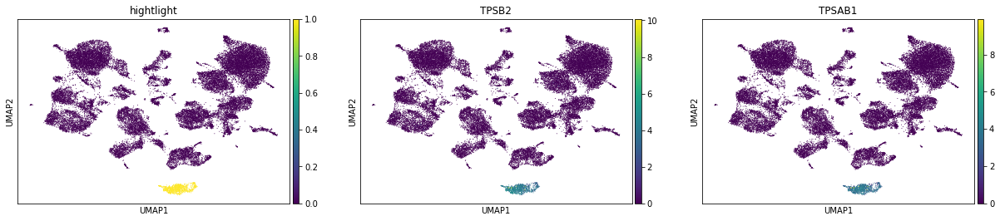

16


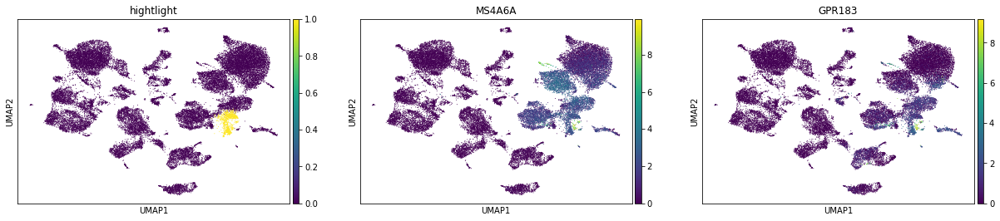

17


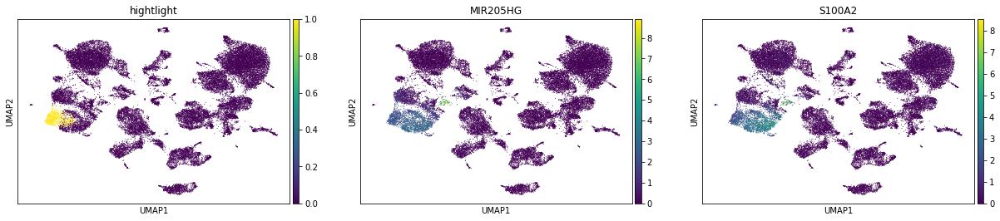

18


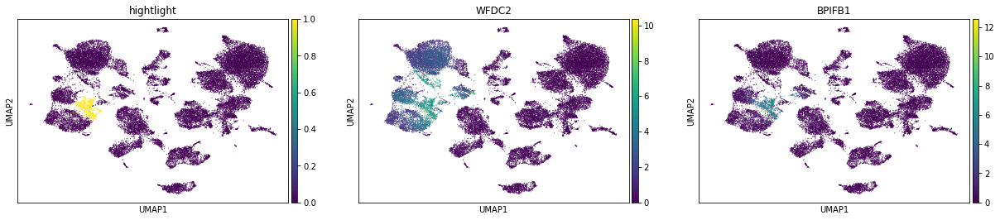

19


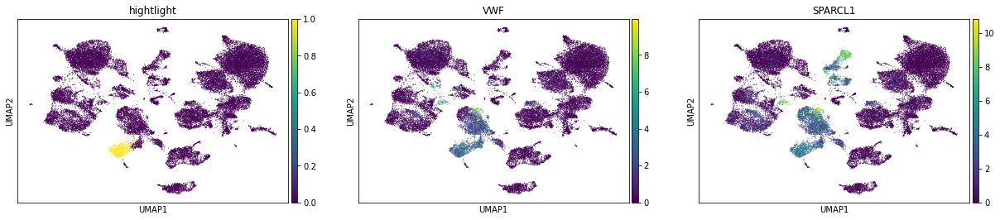

20


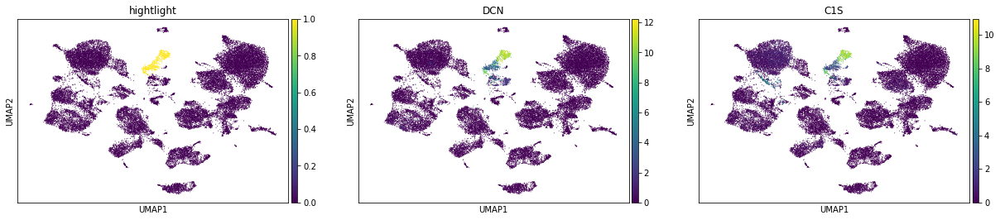

21


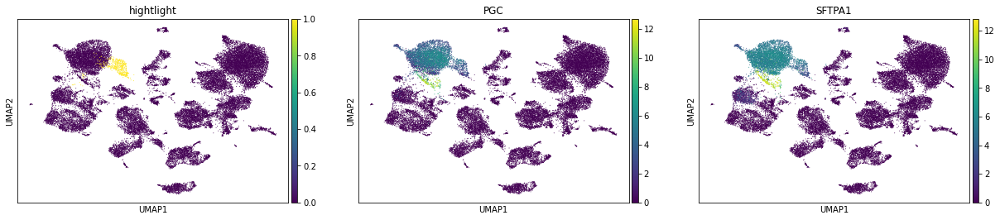

22


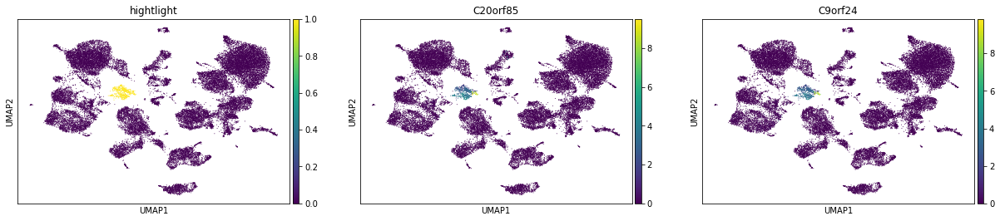

23


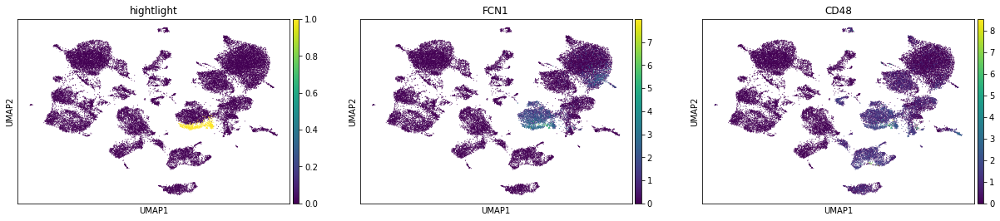

24


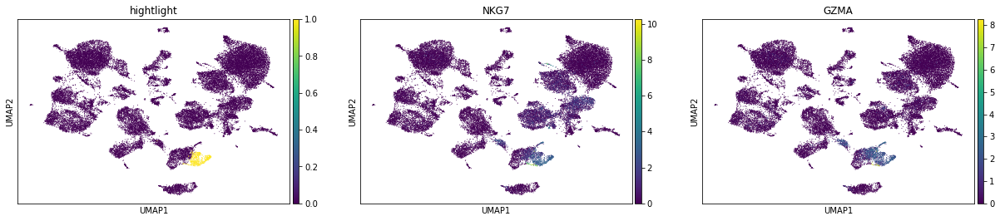

25


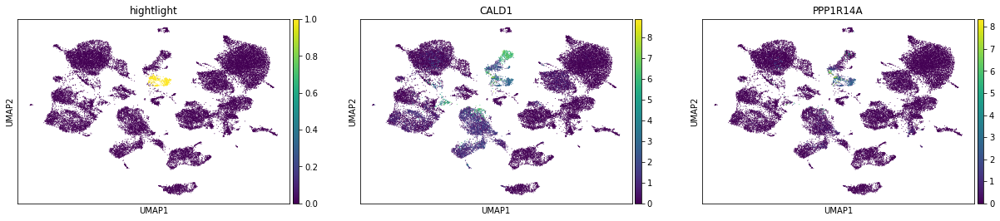

26


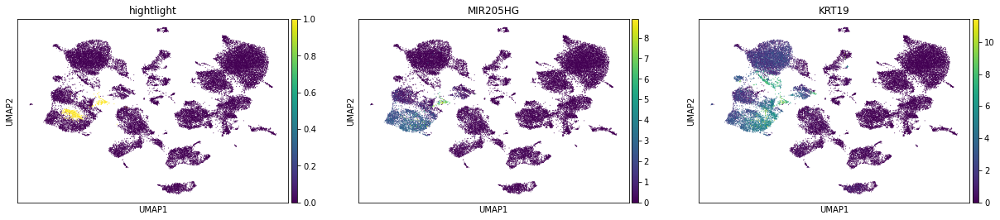

27


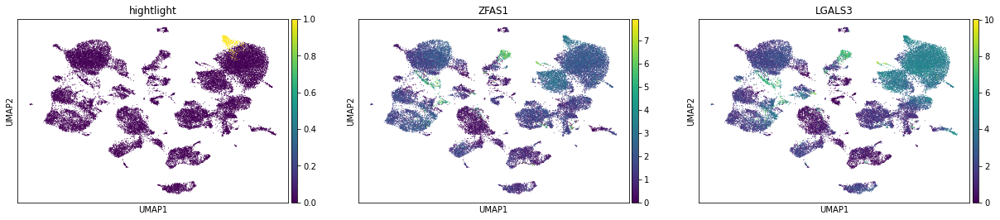

28


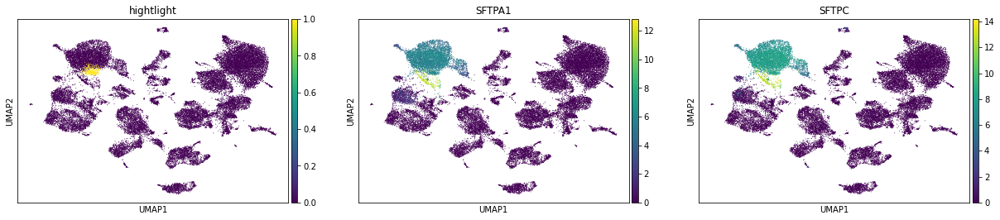

29


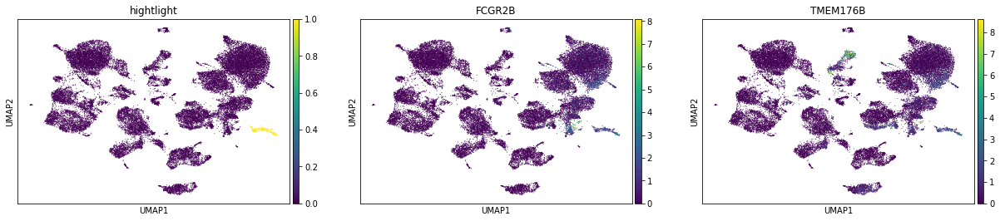

30


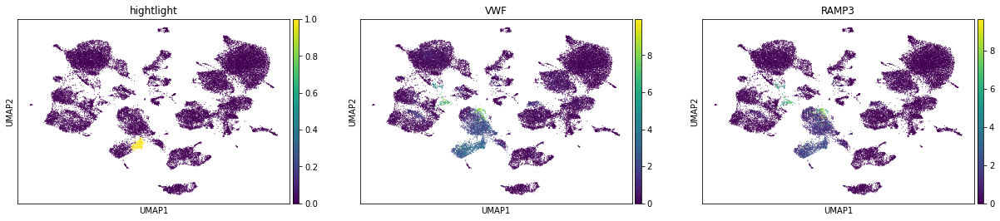

31


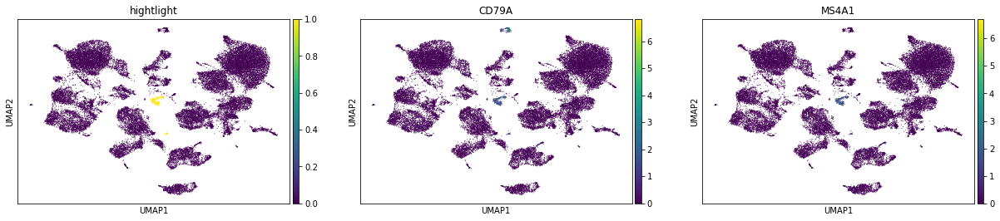

32


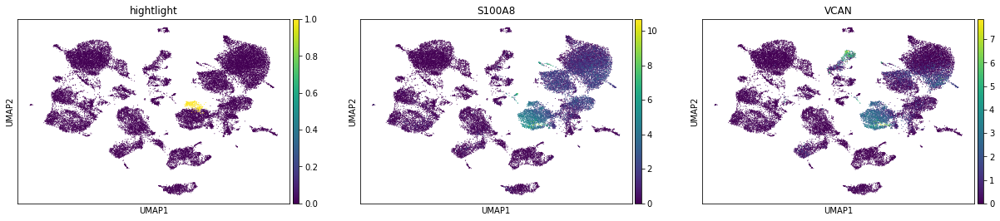

33


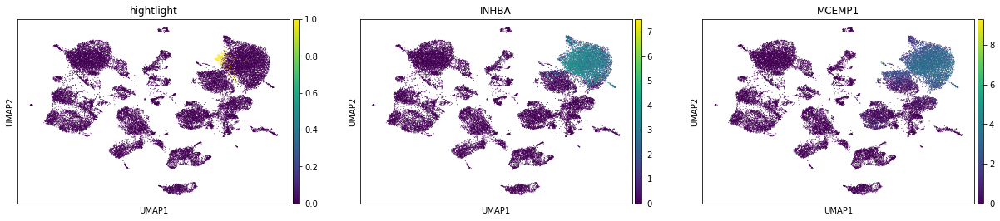

34


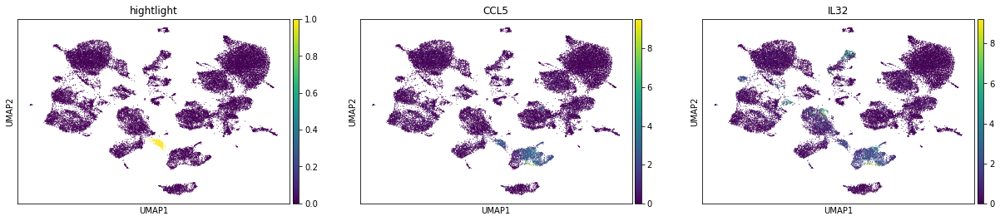

35


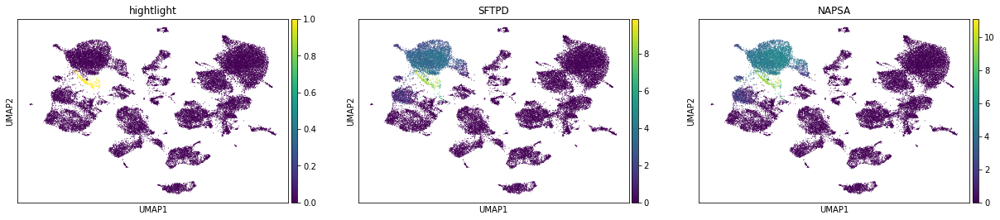

36


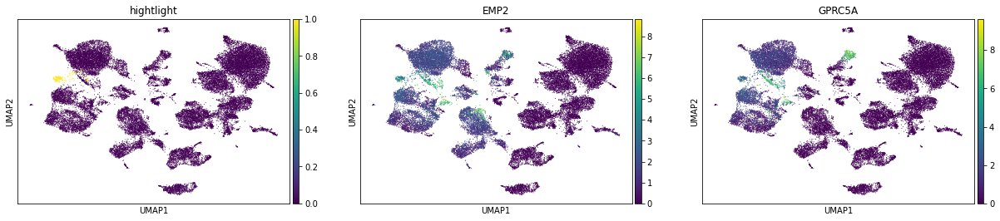

37


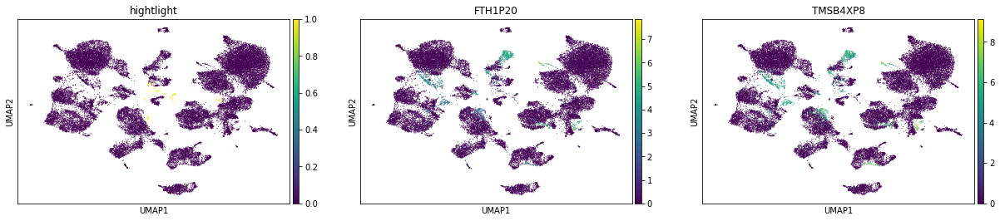

38


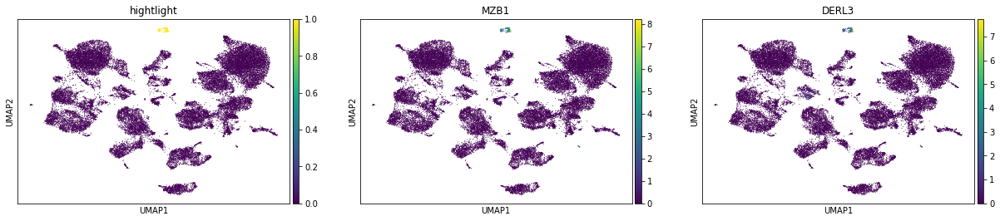

39


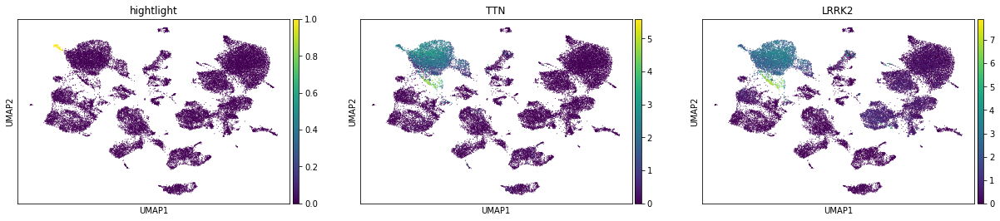

40


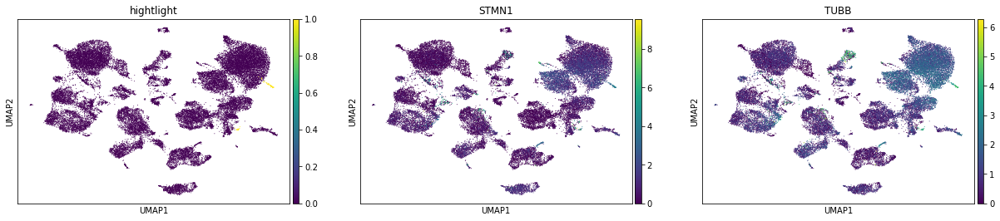

41


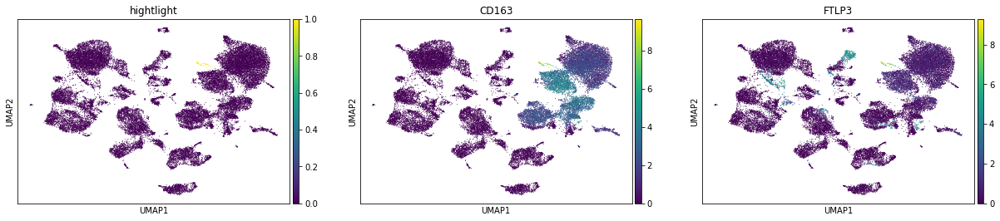

42


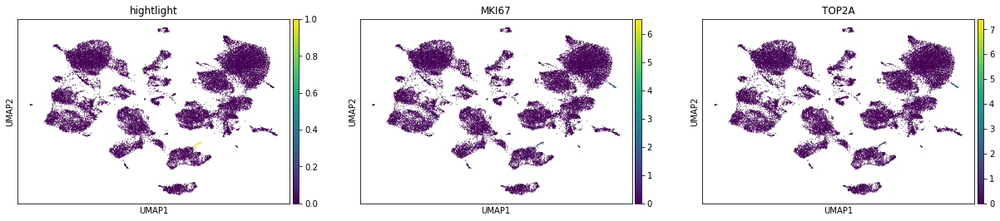

43


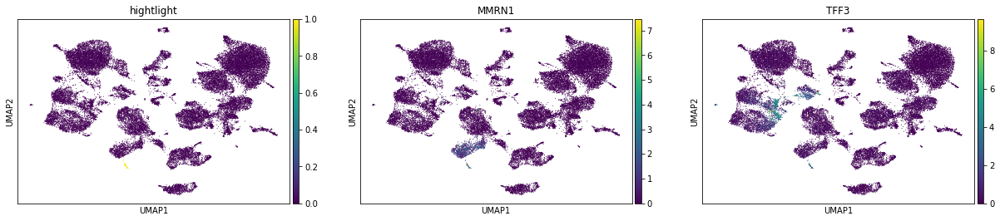

44


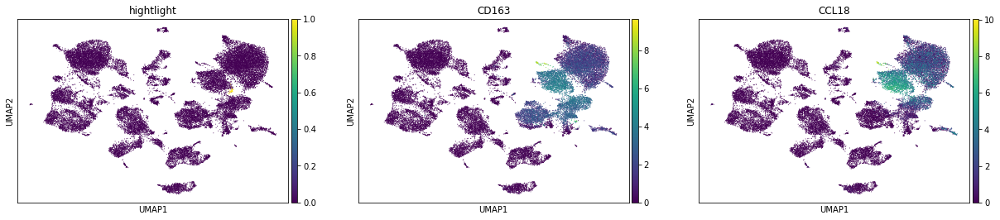

45


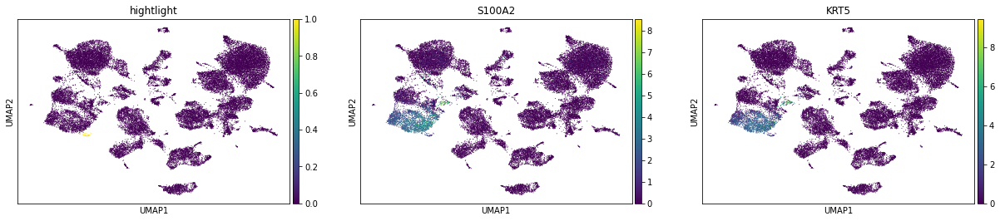

46


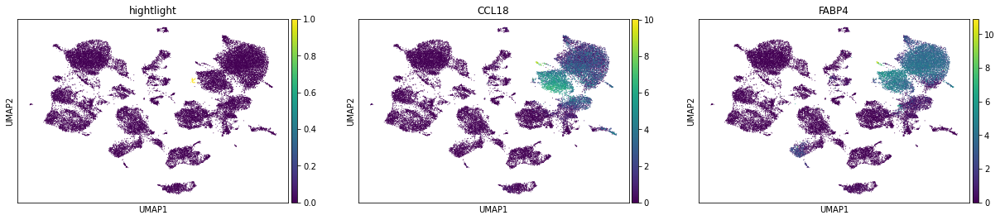

47


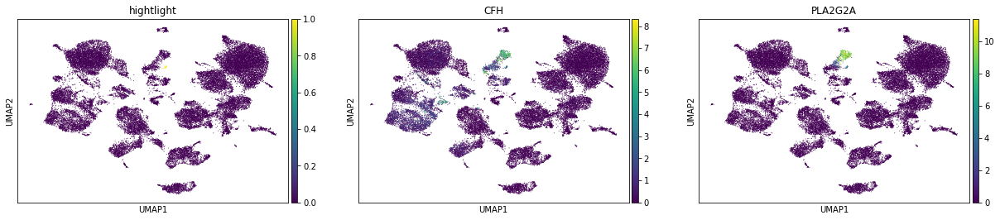

48


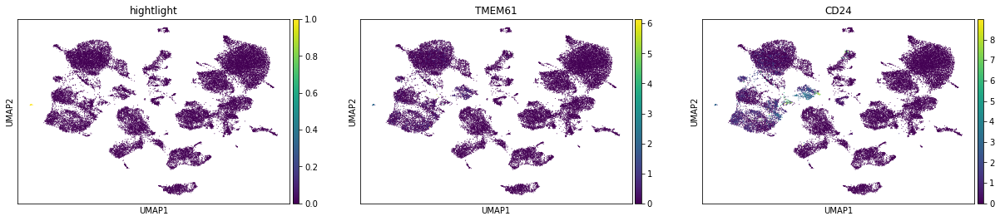

49


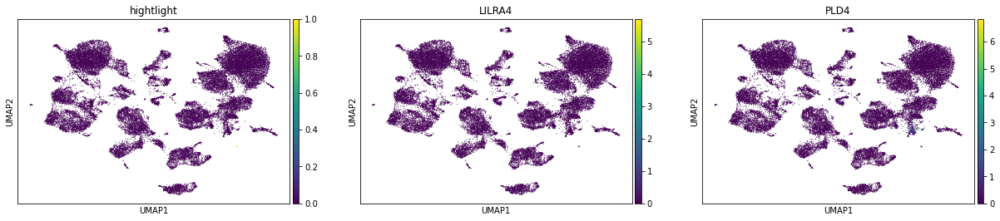

<IPython.core.display.Javascript object>

In [79]:
for x in DE.keys():
    print(x)
    topgenes = list(FilterDE(DE, x)[:2].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

# read in cell ontology 

In [32]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



<IPython.core.display.Javascript object>

You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [33]:
celltype_dict["T cell"]

'CL:0000084'

<IPython.core.display.Javascript object>

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [51]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


def PrintParents(co, node, pattern=""):
    parents = [x for x in co.successors(celltype_dict[node])]
    return [co.nodes[x]["name"] for x in parents if pattern in co.nodes[x]["name"]]



<IPython.core.display.Javascript object>

# read data 

In [35]:
organ = "Lung"
organ_adata = read_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)

<IPython.core.display.Javascript object>

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [64]:
PrintChildren(co, "adventitial cell")

['fibroblast of tunica adventitia of artery',
 'fibroblast of the aortic adventitia',
 'fibrocyte of adventitia of ureter',
 'ureter adventitial cell']

<IPython.core.display.Javascript object>

In [65]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
cluster_mapping = {
    "0": "macrophage",
    "1": "macrophage",
    "2": "type II pneumocyte",
    "3": "macrophage",
    "4": "classical monocyte",
    "5": "type II pneumocyte",
    "6": "macrophage",
    "7": "macrophage",
    "8": "macrophage",
    "9": "capillary endothelial cell",
    "10": "club cell",
    "11": "CD4-positive, alpha-beta T cell",
    "12": "capillary endothelial cell",
    "13": "basal cell",
    "14": "type II pneumocyte",
    "15": "basophil",
    "16": "dendritic cell",
    "17": "basal cell",
    "18": "respiratory goblet cell",
    "19": "capillary endothelial cell",
    "20": "mesenchymal cell",
    "21": "type II pneumocyte",
    "22": "lung ciliated cell",
    "23": "classical monocyte",
    "24": "CD8-positive, alpha-beta T cell",
    "25": "pericyte cell",
    "26": "basal cell",
    "27": "macrophage",
    "28": "type II pneumocyte",
    "29": "dendritic cell",
    "30": "vein endothelial cell",
    "31": "B cell",
    "32": "classical monocyte",
    "33": "macrophage",
    "34": "CD8-positive, alpha-beta T cell",
    "35": "type II pneumocyte",
    "36": "type I pneumocyte",
    "37": "capillary endothelial cell",
    "38": "plasma cell",
    "39": "type II pneumocyte",
    "40": "macrophage",
    "41": "macrophage",
    "42": "natural killer cell",
    "43": "endothelial cell of lymphatic vessel",
    "44": "macrophage",
    "45": "basal cell",
    "46": "macrophage",
    "47": "mesothelial cell",
    "48": "ionocyte",
    "49": "plasmacytoid dendritic cell",
}
# cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

<IPython.core.display.Javascript object>

This cell will automatically replace the leiden cluster names with cell type annotations

In [66]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
#     display(DE[l][cluster_markers[l]])

<IPython.core.display.Javascript object>

In [67]:
PrintParents(co, "adventitial cell")

['supportive cell', 'connective tissue cell']

<IPython.core.display.Javascript object>

In [68]:
PrintChildren(co, "supportive cell", "adven")

['fibroblast of tunica adventitia of artery',
 'fibrocyte of adventitia of ureter',
 'ureter adventitial cell',
 'adventitial cell',
 'fibroblast of the aortic adventitia']

<IPython.core.display.Javascript object>

# Visualize the results of the manual annotation

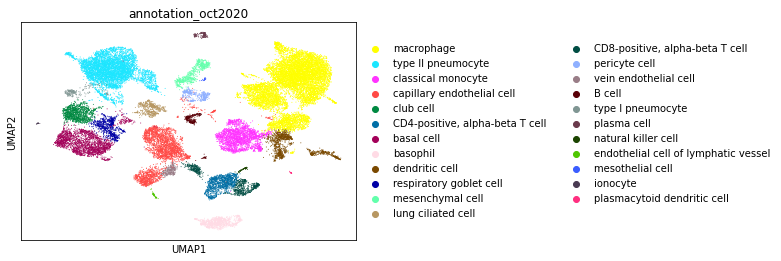

<IPython.core.display.Javascript object>

In [69]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# create celltype subcluster
This is just an example once the celltype annotations are done, how to subcluster cells in a celltype

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



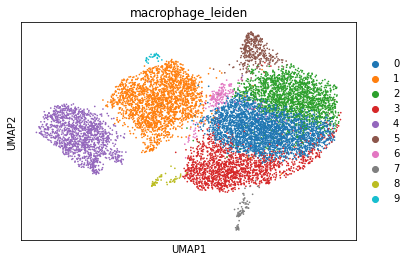

<IPython.core.display.Javascript object>

In [70]:
celltype = "macrophage"
sub_organ_adata = organ_adata[organ_adata.obs["annotation_oct2020"] == celltype]
sc.pp.neighbors(sub_organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(
    sub_organ_adata,
)
sc.tl.leiden(sub_organ_adata, resolution=0.5, key_added="%s_leiden" % celltype)
sc.pl.umap(
    sub_organ_adata,
    color=["%s_leiden" % celltype],
    ncols=3,
)

In [71]:
sc.tl.rank_genes_groups(
    sub_organ_adata, groupby="%s_leiden" % celltype, method="wilcoxon"
)
sub_DE = FormatDE(sub_organ_adata.uns["rank_genes_groups"])

<IPython.core.display.Javascript object>

In [78]:
# for x in sub_DE.keys():
#     print(x)
#     topgenes = list(FilterDE(sub_DE, x)[:5].index)
#     sub_organ_adata.obs["hightlight"] = sub_organ_adata.obs["%s_leiden" % celltype] == x
#     sc.pl.umap(
#         sub_organ_adata,
#         color=["hightlight"] + topgenes,
#         ncols=3,
#     )

<IPython.core.display.Javascript object>

# manually create mapping between cell type and compartment (this is just an example)

In [73]:
np.unique(organ_adata.obs["annotation_oct2020"])

array(['B cell', 'CD4-positive, alpha-beta T cell',
       'CD8-positive, alpha-beta T cell', 'basal cell', 'basophil',
       'capillary endothelial cell', 'classical monocyte', 'club cell',
       'dendritic cell', 'endothelial cell of lymphatic vessel',
       'ionocyte', 'lung ciliated cell', 'macrophage', 'mesenchymal cell',
       'mesothelial cell', 'natural killer cell', 'pericyte cell',
       'plasma cell', 'plasmacytoid dendritic cell',
       'respiratory goblet cell', 'type I pneumocyte',
       'type II pneumocyte', 'vein endothelial cell'], dtype=object)

<IPython.core.display.Javascript object>

In [74]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {
    "B cell": "Immune",
    "CD4-positive, alpha-beta T cell": "Immune",
    "CD8-positive, alpha-beta T cell": "Immune",
    "basal cell": "Epithelial",
    "basophil": "Immune",
    "capillary endothelial cell": "Endothelial",
    "classical monocyte": "Immune",
    "club cell": "Epithelial",
    "dendritic cell": "Immune",
    "endothelial cell of lymphatic vessel": "Endothelial",
    "ionocyte": "Epithelial",
    "lung ciliated cell": "Epithelial",
    "macrophage": "Immune",
    "mesenchymal cell": "Stromal",
    "mesothelial cell": "Stromal",
    "natural killer cell": "Immune",
    "pericyte cell": "Stromal",
    "plasma cell": "Immune",
    "plasmacytoid dendritic cell": "Immune",
    "respiratory goblet cell": "Epithelial",
    "type I pneumocyte": "Epithelial",
    "type II pneumocyte": "Epithelial",
    "vein endothelial cell": "Endothelial",
}

<IPython.core.display.Javascript object>

This cell will automatically replace the leiden cluster names with cell type annotations

In [75]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

<IPython.core.display.Javascript object>

# Visualize the results of the new compartment splitting

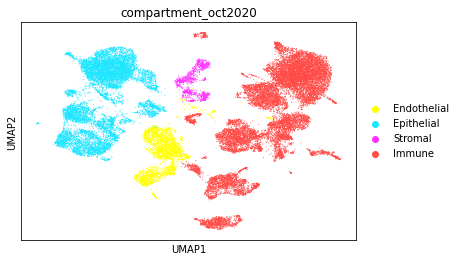

<IPython.core.display.Javascript object>

In [76]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [77]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.oct2020.h5ad" % organ
)

<IPython.core.display.Javascript object>